In [86]:
# Imports all the libraries needed for the project
!pip install folium mapclassify matplotlib geopandas
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
from folium.plugins import HeatMap

In [87]:
# Install dashboard deps from the notebook (run once)
%pip install plotly streamlit-folium


   ---------------------------------------- 0.0/524.4 kB ? eta -:--:--
   ---------------------------------------- 0.0/524.4 kB ? eta -:--:--
   ---------------------------------------- 524.4/524.4 kB 1.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [88]:
# read the data
df = pd.read_csv('tran.csv')
# drop the unnamed column not needed
df.drop(columns=['Unnamed: 0'], inplace=True)

In [89]:
# convert the trans_date_trans_time column to datetime
df['trans_datetime'] = pd.to_datetime(df['trans_date_trans_time'])


In [90]:
# check the value counts of the is_fraud column
df['is_fraud'].value_counts()

is_fraud
0    1289169
1       7506
Name: count, dtype: int64

In [91]:
# Keep only fraud transactions
before = len(df)
df = df[df['is_fraud'] == 1].copy()
df.reset_index(drop=True, inplace=True)
after = len(df)
print(f"Kept {after} of {before} rows (is_fraud == 1)")

Kept 7506 of 1296675 rows (is_fraud == 1)


In [92]:
# drop the columns zip, trans_date_trans_time, cc_num, merchant, city_pop, job, trans_num, unix_time, merch_zipcode not needed
df.drop(columns=['zip','trans_date_trans_time','cc_num', 'merchant', 'city_pop', 
                                                     'job', 'trans_num', 'unix_time', 
                                                          'merch_zipcode'], inplace=True)


In [93]:
from datetime import datetime

# Calculate age from dob and add as new column 'age' (robust)
today = pd.Timestamp('now')
dob = pd.to_datetime(df['dob'], errors='coerce')
age_years = (today - dob).dt.days / 365.25
# Use nullable Int64 to preserve NaN for invalid/missing dob
df['age'] = np.floor(age_years).astype('Int64')


In [94]:
# drop the dob column
df.drop(columns=['dob'], inplace=True)

In [95]:
# drop the rows with missing values after dropping the dob column
df.dropna(inplace=True)


In [96]:
# create a geopandas dataframe from the dataframe
gdf_merch = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['merch_long'], df['merch_lat']), crs="EPSG:4326")

In [97]:
# display the dataframe using the explore method
gdf_merch.explore()


In [98]:
# HeatMap using gdf_merch
center_m = [gdf_merch.geometry.y.mean(), gdf_merch.geometry.x.mean()]
map_hm = folium.Map(location=center_m, zoom_start=5, tiles='CartoDB positron')
heat_points_m = [[pt.y, pt.x] for pt in gdf_merch.geometry]
HeatMap(heat_points_m, radius=8, blur=10, min_opacity=0.3).add_to(map_hm)
map_hm


In [99]:
# MarkerCluster using gdf_merch
from folium.plugins import MarkerCluster
map_mc = folium.Map(location=center, zoom_start=5, tiles='OpenStreetMap')
cluster = MarkerCluster().add_to(map_mc)

sample = gdf_merch.sample(min(7000, len(gdf_merch)), random_state=42)
for _, row in sample.iterrows():
    folium.Marker([row.geometry.y, row.geometry.x]).add_to(cluster)

map_mc


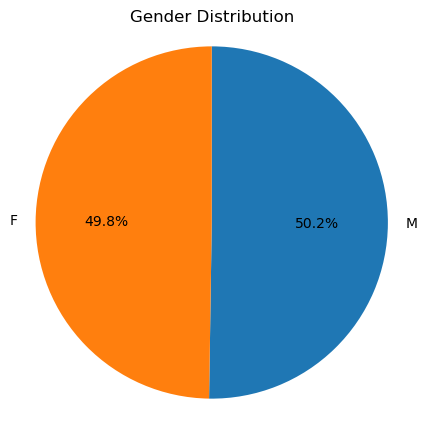

In [100]:
# Pie chart: Gender distribution
import matplotlib.pyplot as plt

counts = df['gender'].value_counts(dropna=False)
labels = counts.index.astype(str)

plt.figure(figsize=(5,5))
plt.pie(counts.values, labels=labels, autopct='%1.1f%%', startangle=90, counterclock=False)
plt.title('Gender Distribution')
plt.axis('equal')
plt.show()


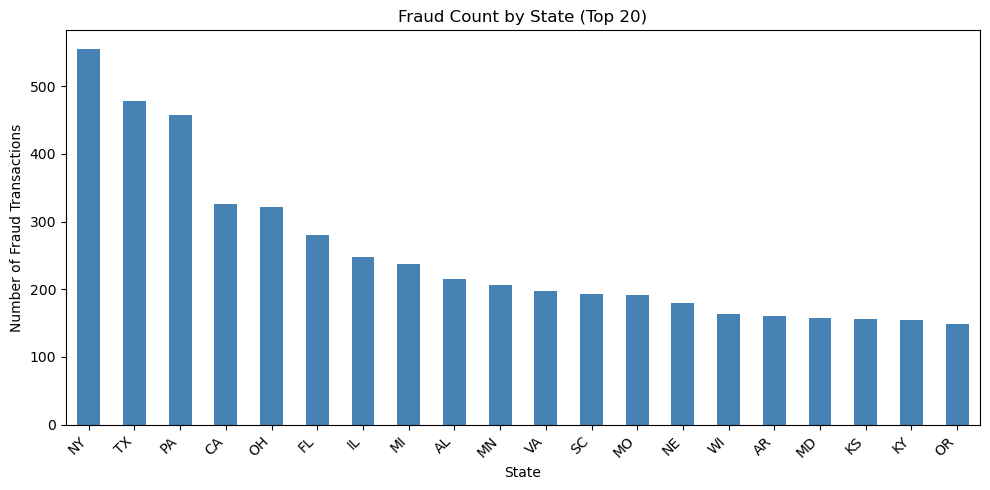

In [101]:
# Bar chart: Fraud count by state 
state_counts = df['state'].value_counts()

plt.figure(figsize=(10,5))
state_counts.head(20).plot(kind='bar', color='steelblue')
plt.title('Fraud Count by State (Top 20)')
plt.xlabel('State')
plt.ylabel('Number of Fraud Transactions')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


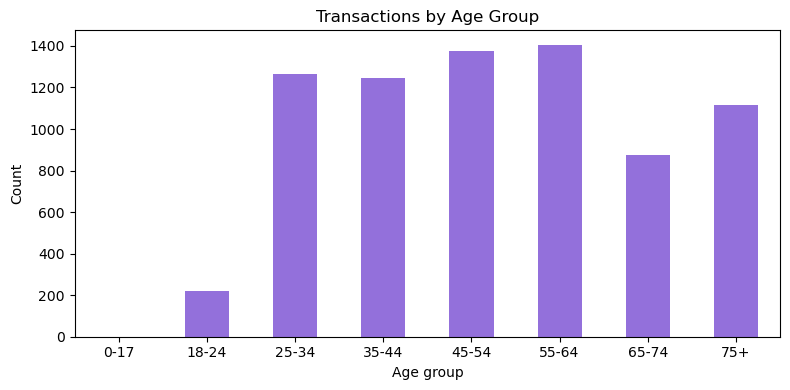

In [102]:
# Bar chart: Transactions by age group 
# Define age bins and labels
bins = [0, 18, 25, 35, 45, 55, 65, 75, 120]
labels = ['0-17', '18-24', '25-34', '35-44', '45-54', '55-64', '65-74', '75+']

ages = df['age'].dropna()
age_groups = pd.cut(ages, bins=bins, labels=labels, right=True, include_lowest=True)
counts = age_groups.value_counts().reindex(labels, fill_value=0)

plt.figure(figsize=(8,4))
counts.plot(kind='bar', color='mediumpurple')
plt.title('Transactions by Age Group')
plt.xlabel('Age group')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


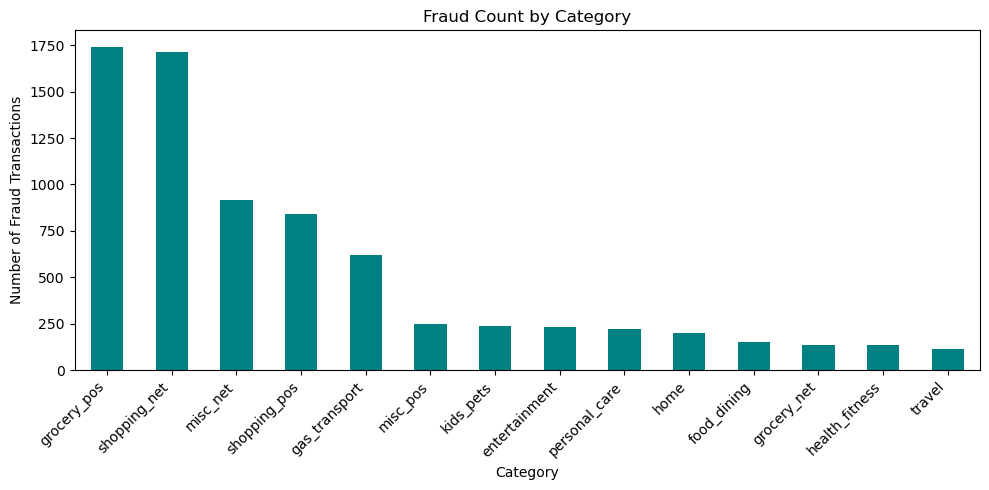

In [103]:
# Bar chart: Fraud count by category
cat_counts = df['category'].value_counts()

plt.figure(figsize=(10,5))
cat_counts.plot(kind='bar', color='teal')
plt.title('Fraud Count by Category')
plt.xlabel('Category')
plt.ylabel('Number of Fraud Transactions')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


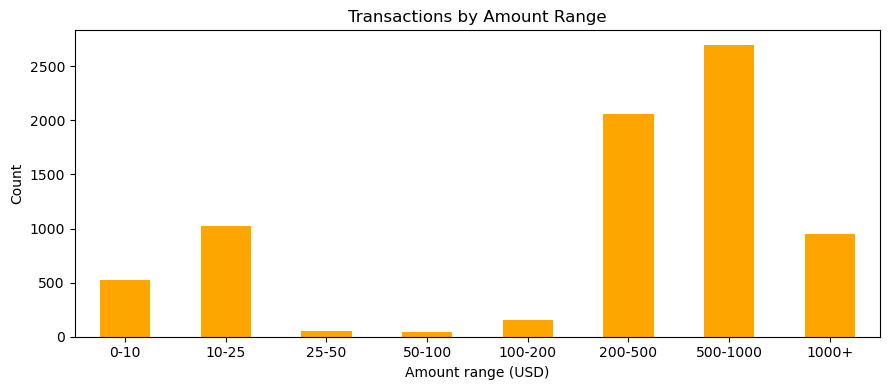

In [104]:
# Bar chart: Transactions by amount ranges
amt = df['amt'].dropna()

bins = [0, 10, 25, 50, 100, 200, 500, 1000, np.inf]
labels = ['0-10', '10-25', '25-50', '50-100', '100-200', '200-500', '500-1000', '1000+']

amt_groups = pd.cut(amt, bins=bins, labels=labels, right=False)
counts = amt_groups.value_counts().reindex(labels, fill_value=0)

plt.figure(figsize=(9,4))
counts.plot(kind='bar', color='orange')
plt.title('Transactions by Amount Range')
plt.xlabel('Amount range (USD)')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


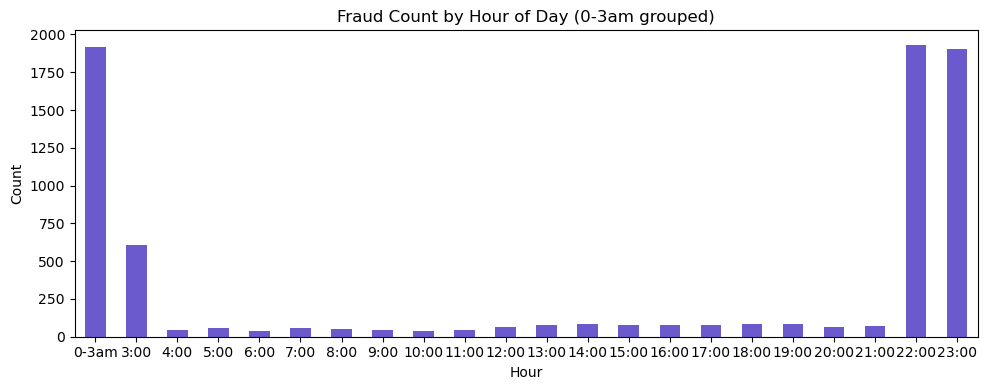

In [34]:
# Fraud by hour of day (bin 0:00-2:59 as '0-3am', then hourly bins)
import matplotlib.pyplot as plt
import numpy as np

# Create a new column for binned hours: 0-2 as '0-3am', then 3,4,...23 as their own bins
def hour_bin(h):
    if h < 3:
        return '0-3am'
    else:
        return f'{h}:00'

hours = df['trans_datetime'].dt.hour
hour_bins = hours.apply(hour_bin)

# Define bin order: '0-3am', '3:00', '4:00', ..., '23:00'
bin_order = ['0-3am'] + [f'{h}:00' for h in range(3,24)]

hour_counts = hour_bins.value_counts().reindex(bin_order, fill_value=0)

plt.figure(figsize=(10,4))
hour_counts.plot(kind='bar', color='slateblue')
plt.title('Fraud Count by Hour of Day (0-3am grouped)')
plt.xlabel('Hour')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


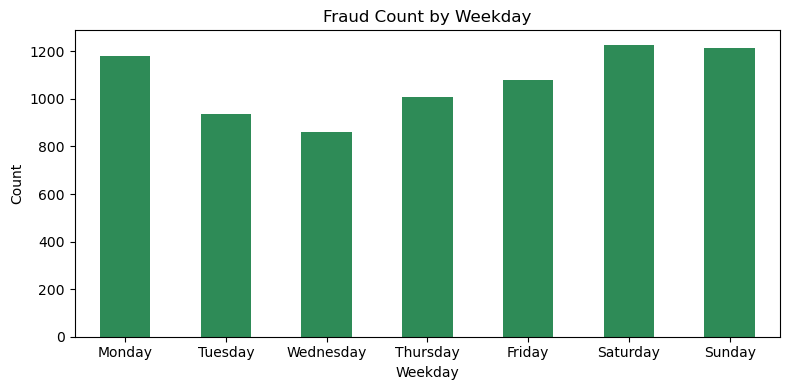

In [106]:
# Fraud by weekday
import matplotlib.pyplot as plt

weekday = df['trans_datetime'].dt.day_name()
order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
weekday_counts = weekday.value_counts().reindex(order)

plt.figure(figsize=(8,4))
weekday_counts.plot(kind='bar', color='seagreen')
plt.title('Fraud Count by Weekday')
plt.xlabel('Weekday')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


In [33]:
# Choropleth: Fraud count by state
import folium
import pandas as pd
import json
import requests

state_counts = df['state'].value_counts().rename_axis('state').reset_index(name='count')

m_choro = folium.Map(location=[37.8, -96], zoom_start=4, tiles='CartoDB positron')
geojson_url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json'

# Download and load the geojson for state boundaries
geojson_data = requests.get(geojson_url).json()

# Add the choropleth layer
folium.Choropleth(
    geo_data=geojson_data,
    name='choropleth',
    data=state_counts,
    columns=['state', 'count'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Fraud Count'
).add_to(m_choro)

# Add state names as labels on the map
for feature in geojson_data['features']:
    state_name = feature['id']
    # Get the centroid of the state's geometry
    geometry = feature['geometry']
    # Handle both Polygon and MultiPolygon
    if geometry['type'] == 'Polygon':
        coords = geometry['coordinates'][0]
    elif geometry['type'] == 'MultiPolygon':
        coords = geometry['coordinates'][0][0]
    else:
        continue
    # Calculate centroid
    lats = [c[1] for c in coords]
    lons = [c[0] for c in coords]
    centroid = [sum(lats)/len(lats), sum(lons)/len(lons)]
    folium.map.Marker(
        location=centroid,
        icon=folium.DivIcon(html=f"""<div style="font-size:10px; color:black; text-align:center;">{state_name}</div>""")
    ).add_to(m_choro)

folium.LayerControl().add_to(m_choro)
m_choro


In [108]:
# Weighted HeatMap by transaction amount (gdf_merch)
from folium.plugins import HeatMap

m_w = folium.Map(location=[gdf_merch.geometry.y.mean(), gdf_merch.geometry.x.mean()], zoom_start=5, tiles='CartoDB positron')

df_w = gdf_merch[['merch_lat','merch_long','amt']].dropna().copy()
# normalize weights for stability
w = df_w['amt'].clip(upper=df_w['amt'].quantile(0.99))
w = (w - w.min()) / (w.max() - w.min() + 1e-9)
heat_weighted = list(zip(df_w['merch_lat'], df_w['merch_long'], w))
HeatMap(heat_weighted, radius=8, blur=10, min_opacity=0.3, max_val=1.0).add_to(m_w)
m_w


C:\Users\Turki\AppData\Local\Temp\ipykernel_7720\3563400076.py:11: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  HeatMap(heat_weighted, radius=8, blur=10, min_opacity=0.3, max_val=1.0).add_to(m_w)


In [ ]:
# Proportional circles by amount (gdf_merch) - simplified
from branca.colormap import linear

m_circ = folium.Map(
    location=[gdf_merch['merch_lat'].mean(), gdf_merch['merch_long'].mean()],
    zoom_start=5, tiles='CartoDB positron'
)

sample = gdf_merch[['merch_lat', 'merch_long', 'amt', 'category']].dropna()
if len(sample) > 3000:
    sample = sample.sample(3000, random_state=42)

amt_clip = sample['amt'].clip(upper=sample['amt'].quantile(0.99))
colormap = linear.OrRd_09.scale(amt_clip.min(), amt_clip.max())

# Vectorized calculation for radius
radius = 2 + 8 * (amt_clip - amt_clip.min()) / (amt_clip.max() - amt_clip.min() + 1e-9)

for (lat, lon, val, cat, rad) in zip(
    sample['merch_lat'], sample['merch_long'], amt_clip, sample['category'], radius
):
    folium.CircleMarker(
        location=[lat, lon],
        radius=rad,
        color=colormap(val),
        fill=True, fill_color=colormap(val), fill_opacity=0.6,
        popup=f"{cat} ${val:.2f}"
    ).add_to(m_circ)

colormap.caption = 'Transaction Amount'
colormap.add_to(m_circ)
m_circ
